<h1 style="color: #FF5733;">Project Name: Anticipez les besoins en consommation de bâtiments </h1> 


- goal is to help Seattle decide policy effectiveness and identify clear factors influencing energy and emissions

- This project is about predicting CO₂ emissions and total energy consumption of non residental  buildings in Seattle.

- To assess the usefulness of the "ENERGY STAR Score" in predicting emissions.

<h1 style="color: green;"> 1. Introduction </h1> 

###  1.1 Importing modules 

In [2]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
#  Change the settings of the jupyter to see all columns
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_row', 100)

### 1.2 Reading Data

In [4]:
building_data= pd.read_csv("2016_Building_Energy_Benchmarking.csv")

In [5]:
building_data.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.00,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.00,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.00,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,2214446.25,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.00,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [6]:
 building_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

### 1.3 Check missing values

In [7]:
def nan_check(data):
    '''Check Missing Values'''
    total = data.isnull().sum()
    percent_1 = data.isnull().sum()/data.isnull().count()*100
    percent_2 = (np.round(percent_1, 2))
    missing_data = pd.concat([total, percent_2], 
                             axis=1, keys=['Total', '%']).sort_values('%', ascending=False)
    return missing_data
nan_check(building_data)

,Total,%
Comments,3376,100.00
Outlier,3344,99.05
YearsENERGYSTARCertified,3257,96.48
ThirdLargestPropertyUseType,2780,82.35
ThirdLargestPropertyUseTypeGFA,2780,82.35
SecondLargestPropertyUseType,1697,50.27
SecondLargestPropertyUseTypeGFA,1697,50.27
ENERGYSTARScore,843,24.97
LargestPropertyUseTypeGFA,20,0.59
LargestPropertyUseType,20,0.59


### 1.4 Remove residential buildings

In [8]:
building_type = building_data['BuildingType'].value_counts()
building_type

BuildingType
NonResidential          1460
Multifamily LR (1-4)    1018
Multifamily MR (5-9)     580
Multifamily HR (10+)     110
SPS-District K-12         98
Nonresidential COS        85
Campus                    24
Nonresidential WA          1
Name: count, dtype: int64

In [9]:
# Remove residential buildings to focus on non-residential ones
non_residential_filter = ~(building_data['BuildingType'].str.contains('multifamily', case=False))

# Display how many rows will be removed
print(f'Removing {building_data[~non_residential_filter].shape[0]} residential buildings')

# Apply filter
building_data = building_data[non_residential_filter]

Removing 1708 residential buildings


In [10]:
building_data.shape
#(3376, 46)

(1668, 46)

In [11]:
building_data['BuildingType'].value_counts()


BuildingType
NonResidential        1460
SPS-District K-12       98
Nonresidential COS      85
Campus                  24
Nonresidential WA        1
Name: count, dtype: int64

### 1.4 Duplicates

In [12]:
building_data.duplicated().sum()

np.int64(0)

### 1.5 Drop Non-Informative Columns

In [13]:
# Drop columns that are constant or irrelevant
columns_to_drop = ["City", "State", "Comments", 'DataYear', 'TaxParcelIdentificationNumber',
                  'CouncilDistrictCode', 'YearsENERGYSTARCertified', 'ZipCode']
# 'Address'
building_data.drop(columns=columns_to_drop, inplace=True)

# Verify dropped columns
display(building_data.shape)
#(3376, 46)

(1668, 38)

### 1.6 Stats  

***Numerical***

In [14]:
building_data.describe()

,OSEBuildingID,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
count,1668.000000,1668.000000,1668.000000,1668.000000,1666.000000,1668.000000,1.668000e+03,1668.000000,1.668000e+03,1.662000e+03,855.000000,353.00000,1094.000000,1665.000000,1665.000000,1666.000000,1666.000000,1.666000e+03,1.665000e+03,1.666000e+03,1.666000e+03,1.666000e+03,1.666000e+03,1.666000e+03,1666.000000,1666.000000
mean,16336.346523,47.616054,-122.332908,1961.913669,1.168667,4.121103,1.188427e+05,12897.979017,1.059447e+05,9.876469e+04,36804.160581,14923.13994,65.449726,72.158799,74.568529,175.829892,178.090876,8.437933e+06,8.064790e+06,5.125726e+05,1.712630e+06,5.843493e+06,1.970845e+04,1.970845e+06,184.973301,1.607845
std,13835.292512,0.048168,0.024580,32.741755,2.931409,6.563407,2.973622e+05,42274.511185,2.842116e+05,2.767111e+05,69845.261024,36790.55656,28.492928,74.048129,75.028403,185.932121,185.918749,3.024380e+07,2.203878e+07,5.513944e+06,6.095172e+06,2.079673e+07,9.370814e+04,9.370814e+06,751.976001,2.336882
min,1.000000,47.499170,-122.411820,1900.000000,0.000000,0.000000,1.128500e+04,0.000000,3.636000e+03,5.656000e+03,0.000000,0.00000,1.000000,0.000000,0.000000,0.000000,-2.100000,0.000000e+00,0.000000e+00,0.000000e+00,-3.382680e+04,-1.154170e+05,0.000000e+00,0.000000e+00,-0.800000,-0.020000
25%,582.750000,47.585458,-122.343280,1930.000000,1.000000,1.000000,2.947775e+04,0.000000,2.847525e+04,2.552750e+04,5350.000000,2663.00000,48.000000,33.700001,35.400002,76.450001,79.325003,1.229291e+06,1.294615e+06,0.000000e+00,2.114083e+05,7.213255e+05,0.000000e+00,0.000000e+00,19.967500,0.350000
50%,21143.500000,47.612340,-122.332935,1965.000000,1.000000,2.000000,4.928950e+04,0.000000,4.739150e+04,4.377050e+04,12000.000000,5931.00000,73.000000,51.900002,53.900002,130.949997,134.150002,2.554947e+06,2.685146e+06,0.000000e+00,4.724153e+05,1.611881e+06,4.982630e+03,4.982630e+05,49.580000,0.880000
75%,24602.250000,47.649675,-122.321675,1989.000000,1.000000,4.000000,1.053250e+05,0.000000,9.475975e+04,9.198375e+04,31881.000000,12941.00000,89.000000,81.699997,85.199997,203.950001,205.700001,6.913348e+06,7.109712e+06,0.000000e+00,1.420747e+06,4.847589e+06,1.520000e+04,1.520000e+06,142.382500,1.890000
max,50226.000000,47.733870,-122.258640,2015.000000,111.000000,99.000000,9.320156e+06,512608.000000,9.320156e+06,9.320156e+06,686750.000000,459748.00000,100.000000,834.400024,834.400024,2620.000000,2620.000000,8.739237e+08,4.716139e+08,1.349435e+08,1.925775e+08,6.570744e+08,2.979090e+06,2.979090e+08,16870.980000,34.090000


***Categorical***

In [15]:
building_data.describe(include = 'O')

,BuildingType,PrimaryPropertyType,PropertyName,Address,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,ComplianceStatus,Outlier
count,1668,1668,1668,1668,1668,1666,1662,855,353,1668,17
unique,5,22,1664,1647,19,373,56,47,39,4,2
top,NonResidential,Small- and Mid-Sized Office,Airport Way,309 South Cloverdale Street,DOWNTOWN,Office,Office,Parking,Office,Compliant,Low outlier
freq,1460,292,2,4,361,138,497,336,49,1548,15


In [16]:
building_data[['PrimaryPropertyType',	'ListOfAllPropertyUseTypes',	'LargestPropertyUseType','LargestPropertyUseTypeGFA',
               'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',	'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA'
               ,'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)' ]].head()

,PrimaryPropertyType,ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s)
0,Hotel,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,88434,0,88434
1,Hotel,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,103566,15064,88502
2,Hotel,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,956110,196718,759392
3,Hotel,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,61320,0,61320
4,Hotel,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,175580,62000,113580


In [17]:
building_data.shape

(1668, 38)

<h1 style="color: Green;"> 2. Exploration Data Analysis </h1> 

 ## 2.1 Remove Electricity(kWh) & NaturalGas(therms)
- These are just unit conversions of kBtu values.
- Keeping both would introduce multicollinearity.
- kBtu is the standard unit for energy consumption analysis.


***Unit Conversions:***
  
***1 kWh = 3.412 kBtu  ➝ Electricity(kWh) = Electricity(kBtu) / 3.412***

***1 therm = 99.976129 kBtu  ➝ NaturalGas(therms) = NaturalGas(kBtu) / 99.976129***

In [18]:
building_data.drop(columns=['Electricity(kWh)', 'NaturalGas(therms)'], inplace=True)

In [19]:
building_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1668 entries, 0 to 3375
Data columns (total 36 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    1668 non-null   int64  
 1   BuildingType                     1668 non-null   object 
 2   PrimaryPropertyType              1668 non-null   object 
 3   PropertyName                     1668 non-null   object 
 4   Address                          1668 non-null   object 
 5   Neighborhood                     1668 non-null   object 
 6   Latitude                         1668 non-null   float64
 7   Longitude                        1668 non-null   float64
 8   YearBuilt                        1668 non-null   int64  
 9   NumberofBuildings                1666 non-null   float64
 10  NumberofFloors                   1668 non-null   int64  
 11  PropertyGFATotal                 1668 non-null   int64  
 12  PropertyGFAParking       

### 2.2  Removed WN Features (SiteEUIWN, SourceEUIWN, SiteEnergyUseWN)

- Highly correlated with non-WN versions → No additional predictive power. 

- Avoids multicollinearity, which can impact model performance. 

- Simplifies the dataset while preserving all essential information. 

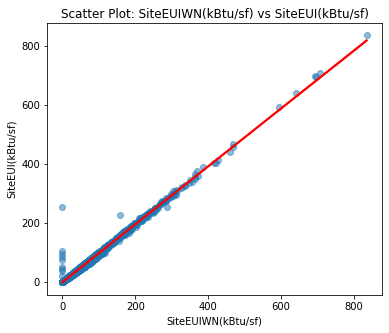

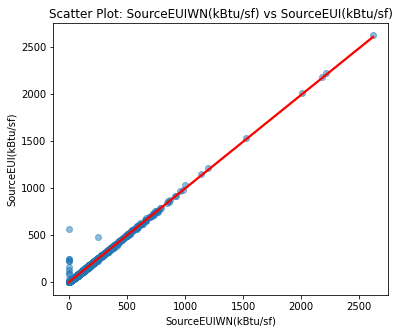

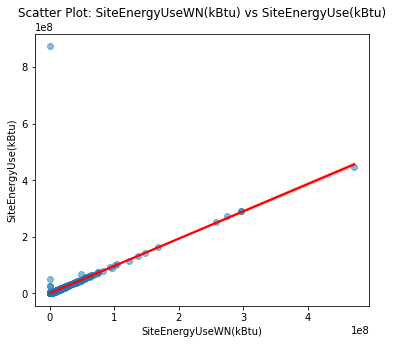

In [20]:
# Function to plot scatter plot with trend line for each WN vs non-WN feature pair
def plot_correlation_scatter(data, wn_feature, non_wn_feature):
    plt.figure(figsize=(6, 5))
    sns.regplot(x=data[wn_feature], y=data[non_wn_feature], scatter_kws={"alpha": 0.5}, line_kws={"color": "red"})
    plt.xlabel(wn_feature)
    plt.ylabel(non_wn_feature)
    plt.title(f"Scatter Plot: {wn_feature} vs {non_wn_feature}")
    plt.show()

# List of WN and corresponding non-WN features
wn_nonwn_pairs = [
    ('SiteEUIWN(kBtu/sf)', 'SiteEUI(kBtu/sf)'),
    ('SourceEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)'),
    ('SiteEnergyUseWN(kBtu)', 'SiteEnergyUse(kBtu)')
]

# Plot scatter plot for each pair separately
for wn_feature, non_wn_feature in wn_nonwn_pairs:
    plot_correlation_scatter(building_data, wn_feature, non_wn_feature)


In [21]:
# WN columns to drop
wn_features = ['SiteEUIWN(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUseWN(kBtu)']

# Drop WN features
building_data.drop(columns=wn_features, inplace=True)

building_data.shape

(1668, 33)

In [22]:
# for col in building_data.columns:   
#     print('\n')
#     print('-'*30)
#     print(col)
#     print('-'*30)
#     print(building_data[col].value_counts())
#     print("^"*65)

### 2.3 Neighborhood
- The 'Neighborhood' column had inconsistencies in capitalization and duplicate entries (e.g., 'Northwest' vs. 'NORTHWEST').  
- We replaced 'DELRIDGE NEIGHBORHOODS' with 'Delridge' and standardized names using title case.  
- This merged duplicates and ensured consistent formatting.


In [23]:
building_data['Neighborhood'].value_counts()

Neighborhood
DOWNTOWN                  361
GREATER DUWAMISH          346
MAGNOLIA / QUEEN ANNE     151
LAKE UNION                148
NORTHEAST                 128
EAST                      121
NORTHWEST                  81
BALLARD                    64
NORTH                      58
CENTRAL                    51
SOUTHEAST                  46
DELRIDGE                   42
SOUTHWEST                  41
North                       9
Ballard                     6
Central                     5
Northwest                   5
Delridge                    4
DELRIDGE NEIGHBORHOODS      1
Name: count, dtype: int64

In [24]:
building_data.loc[:,'Neighborhood'].replace('DELRIDGE NEIGHBORHOODS','Delridge', inplace = True)

/var/folders/dw/ykrtclk13yx5ypn_4csmx6lm0000gn/T/ipykernel_98642/1728782744.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  building_data.loc[:,'Neighborhood'].replace('DELRIDGE NEIGHBORHOODS','Delridge', inplace = True)


In [25]:
building_data['Neighborhood']= building_data['Neighborhood'].str.title()

In [26]:
building_data['Neighborhood'].value_counts()

Neighborhood
Downtown                 361
Greater Duwamish         346
Magnolia / Queen Anne    151
Lake Union               148
Northeast                128
East                     121
Northwest                 86
Ballard                   70
North                     67
Central                   56
Delridge                  47
Southeast                 46
Southwest                 41
Name: count, dtype: int64

### 2.4 ComplianceStatus keep only Compliant 

In [27]:
building_data['ComplianceStatus'].value_counts()

ComplianceStatus
Compliant                       1548
Error - Correct Default Data      88
Non-Compliant                     18
Missing Data                      14
Name: count, dtype: int64

In [28]:
building_data['ComplianceStatus'].value_counts()
building_data.groupby('ComplianceStatus')['SiteEnergyUse(kBtu)'].describe()

,count,mean,std,min,25%,50%,75%,max
ComplianceStatus,,,,,,,,
Compliant,1548.0,8.860058e+06,3.130568e+07,57133.19922,1.251083e+06,2.732167e+06,7.294487e+06,873923712.0
Error - Correct Default Data,88.0,2.960782e+06,2.571226e+06,0.00000,1.534597e+06,2.102175e+06,3.060542e+06,13567774.0
Missing Data,14.0,0.000000e+00,0.000000e+00,0.00000,0.000000e+00,0.000000e+00,0.000000e+00,0.0
Non-Compliant,16.0,5.104836e+06,1.199803e+07,0.00000,6.535117e+04,1.347819e+05,3.651583e+05,41399504.0


/var/folders/dw/ykrtclk13yx5ypn_4csmx6lm0000gn/T/ipykernel_98642/2477076500.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = building_data['ComplianceStatus'],y= building_data['SiteEnergyUse(kBtu)'], palette = 'viridis')


([0, 1, 2, 3],
 [Text(0, 0, 'Compliant'),
  Text(1, 0, 'Error - Correct Default Data'),
  Text(2, 0, 'Missing Data'),
  Text(3, 0, 'Non-Compliant')])

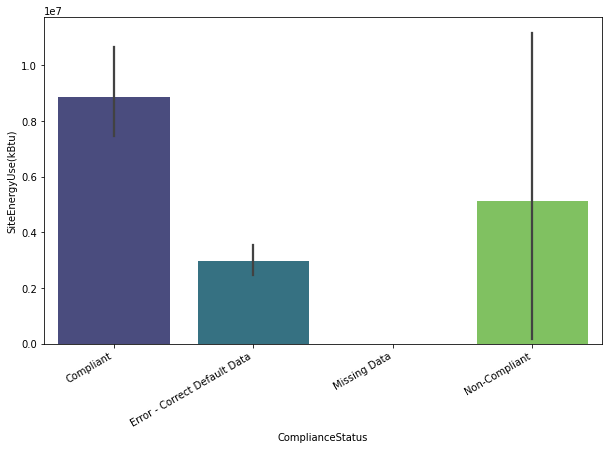

In [29]:
plt.figure(figsize = (10,6))
sns.barplot(x = building_data['ComplianceStatus'],y= building_data['SiteEnergyUse(kBtu)'], palette = 'viridis') 
plt.xticks(rotation= 30, ha = 'right')

***- Check Outlier & DefaultData before keeping only compliant buildings***

In [30]:
print(building_data.Outlier.value_counts())
print(building_data.DefaultData.value_counts())

Outlier
Low outlier     15
High outlier     2
Name: count, dtype: int64
DefaultData
False    1580
True       88
Name: count, dtype: int64


In [31]:
# Remove rows where ComplianceStatus is "Missing Data"
building_data = building_data[building_data["ComplianceStatus"] == 'Compliant'].copy()

In [32]:
# Drop ComplianceStatus column 
building_data = building_data.drop('ComplianceStatus', axis=1)

In [33]:
print(building_data.Outlier.value_counts())
print('-'*20)
print(building_data.DefaultData.value_counts())

Series([], Name: count, dtype: int64)
--------------------
DefaultData
False    1548
Name: count, dtype: int64


- Filtering for "Compliant" buildings removed all outliers and ensured that no data with default values remained (DefaultData = False)

In [34]:
building_data.drop(['DefaultData', 'Outlier'], axis=1, inplace=True)

### 2.5 Missing Values for ENERGYSTAR Score
We need to determine if the ENERGYSTAR score is useful. Therefore we are only remove the building where the value is missing

In [35]:
building_data = building_data[building_data['ENERGYSTARScore'].notna()].copy()

In [36]:
building_data.shape

(997, 30)

In [37]:
building_data['LargestPropertyUseType'].value_counts() 

LargestPropertyUseType
Office                                   403
Non-Refrigerated Warehouse               143
Retail Store                              73
Hotel                                     71
Worship Facility                          63
K-12 School                               49
Distribution Center                       41
Supermarket/Grocery Store                 38
Medical Office                            37
Residence Hall/Dormitory                  19
Senior Care Community                     18
Hospital (General Medical & Surgical)     10
Parking                                    7
Refrigerated Warehouse                     5
Multifamily Housing                        4
Bank Branch                                4
Financial Office                           4
Data Center                                3
Courthouse                                 1
Wholesale Club/Supercenter                 1
Other                                      1
Name: count, dtype: int64

In [38]:
building_data['PrimaryPropertyType'].value_counts() 

PrimaryPropertyType
Small- and Mid-Sized Office    234
Large Office                   160
Warehouse                      141
Hotel                           72
Retail Store                    72
Worship Facility                63
K-12 School                     49
Distribution Center             40
Supermarket / Grocery Store     39
Medical Office                  37
Mixed Use Property              26
Residence Hall                  19
Senior Care Community           18
Other                           11
Hospital                        10
Refrigerated Warehouse           5
Low-Rise Multifamily             1
Name: count, dtype: int64

### 2.6  Largest Property Use Type  &  Primary Property Type 
- How closely PrimaryPropertyType and LargestPropertyUseType matched

In [39]:
# Check how often these two columns differ
selected_columns = [
    'PrimaryPropertyType',
    'LargestPropertyUseType',
    'LargestPropertyUseTypeGFA',
    'PropertyGFATotal',
    'PropertyGFAParking',
    'PropertyGFABuilding(s)'
]
# Check how often these two columns differ

building_data[selected_columns][building_data['PrimaryPropertyType'] != building_data['LargestPropertyUseType']]

,PrimaryPropertyType,LargestPropertyUseType,LargestPropertyUseTypeGFA,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s)
20,Other,Courthouse,537150.0,540360,0,540360
35,Mixed Use Property,Office,757027.0,494835,0,494835
39,Small- and Mid-Sized Office,Office,55586.0,94900,0,94900
40,Small- and Mid-Sized Office,Office,51029.0,52554,0,52554
44,Large Office,Office,103362.0,168115,0,168115
...,...,...,...,...,...,...
3320,Large Office,Office,341897.0,480702,163260,317442
3324,Large Office,Office,342173.0,483397,166208,317189
3329,Large Office,Office,342838.0,536697,197659,339038
3338,Warehouse,Non-Refrigerated Warehouse,52085.0,52085,4222,47863


- Cases where they differed

PrimaryPropertyType = "Small- and Mid-Sized Office"

LargestPropertyUseType = "Office"
___

**Visualizing the Relationship Between `PrimaryPropertyType` & `LargestPropertyUseType`**

**It shows category distribution clearly**

- The Y-axis represents PrimaryPropertyType.

- The colored bars (hue) represent LargestPropertyUseType, allowing us to see how different property types overlap.

**It helps identify redundancy**

- If PrimaryPropertyType always maps to the same LargestPropertyUseType, we can see it clearly.

- If a PrimaryPropertyType has multiple LargestPropertyUseType values, then LargestPropertyUseType is more detailed and should be kept.

**It visually highlights misclassifications**

- If Parking appears in LargestPropertyUseType for non-parking buildings, we can spot the mistake easily.


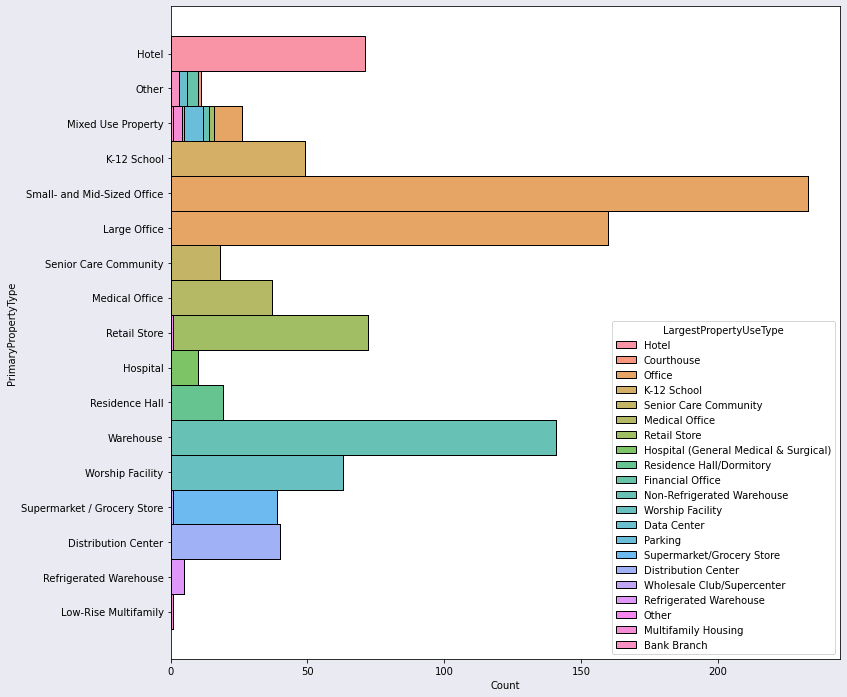

In [40]:
plt.figure(figsize=(12,12), facecolor="#eaeaf2")
sns.histplot(data=building_data, y='PrimaryPropertyType', hue='LargestPropertyUseType', multiple='stack');

🔹 **What Did We Learn?**
- `LargestPropertyUseType` **mostly overlaps with `PrimaryPropertyType`**, confirming that `PrimaryPropertyType` can be **dropped**.  
- Some **categories are too broad** (`Mixed Use Property`, `Other`) → `LargestPropertyUseType` provides **more details**.  

---


**Checking the Relationship with Energy Consumption & Emission**

🔹 **Why?**
- A **boxplot** helps visualize how `PrimaryPropertyType` relates to **energy consumption** (`SiteEUI`).
- If different `PrimaryPropertyType` values **don't significantly change energy use**, it's **not a useful feature for prediction**.

___

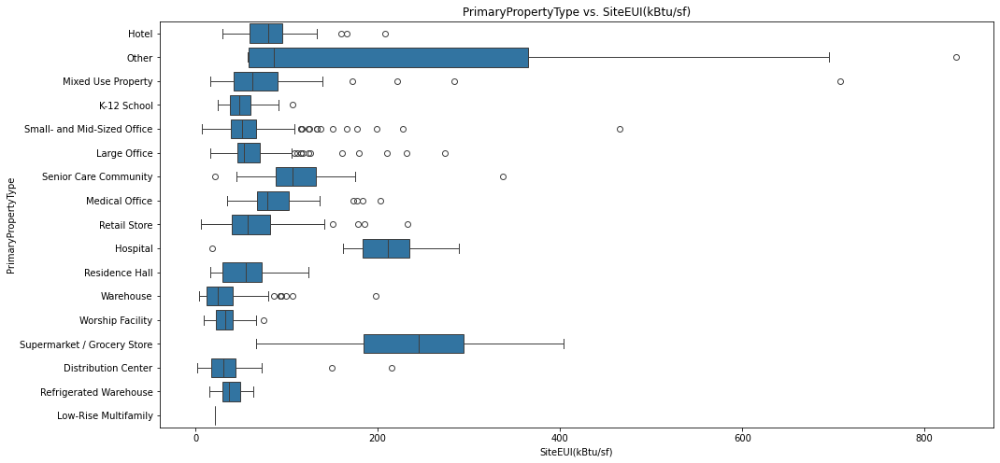

--------------------------------------------------------------------------------------------------------------------------------------------


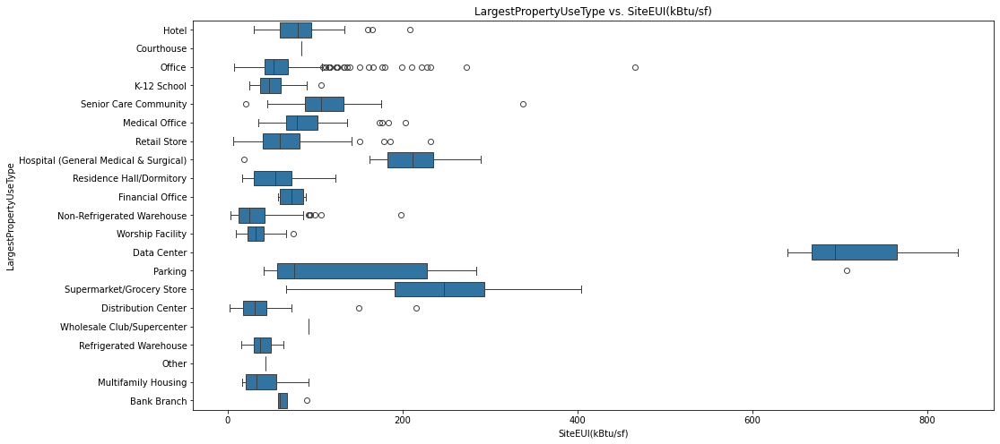

--------------------------------------------------------------------------------------------------------------------------------------------


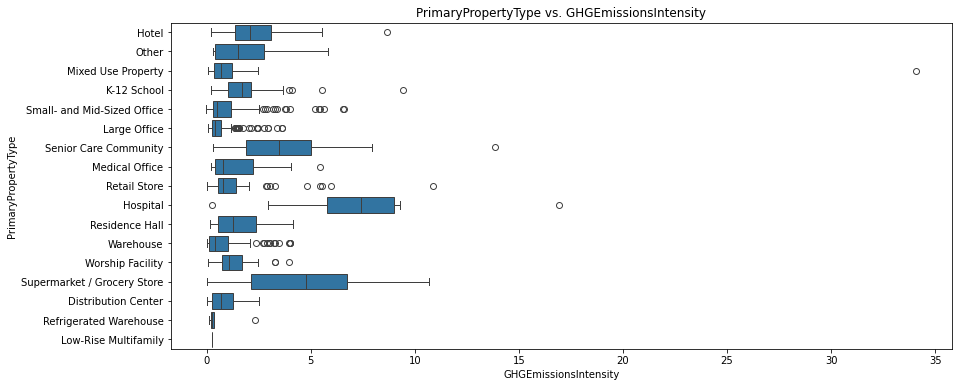

--------------------------------------------------------------------------------------------------------------------------------------------


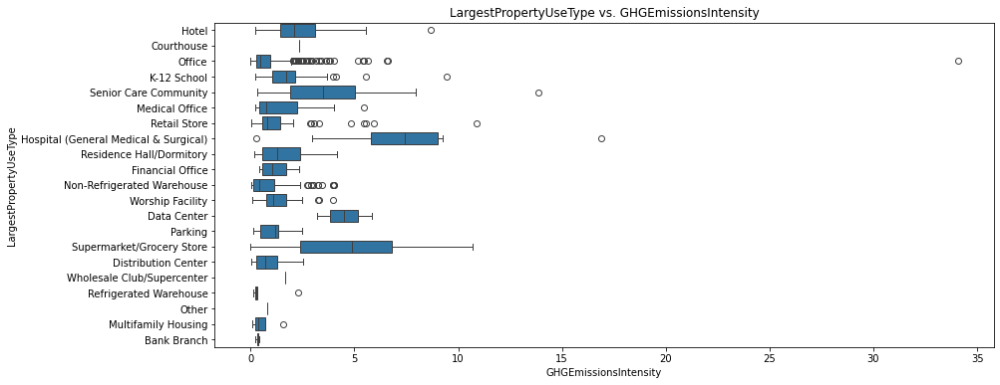

In [41]:
plt.figure(figsize=(16, 8))
sns.boxplot(y='PrimaryPropertyType', x='SiteEUI(kBtu/sf)', data=building_data)
# plt.xticks(rotation=90)
plt.title("PrimaryPropertyType vs. SiteEUI(kBtu/sf)")
plt.show()
print("-"*140)
plt.figure(figsize=(16, 8))
sns.boxplot(y='LargestPropertyUseType', x='SiteEUI(kBtu/sf)', data=building_data)
# plt.xticks(rotation=90)
plt.title("LargestPropertyUseType vs. SiteEUI(kBtu/sf)")
plt.show()
print("-"*140)
plt.figure(figsize=(14, 6))
sns.boxplot(y='PrimaryPropertyType', x='GHGEmissionsIntensity', data=building_data)
# plt.xticks(rotation=90)
plt.title("PrimaryPropertyType vs. GHGEmissionsIntensity")
plt.show()
print("-"*140)
plt.figure(figsize=(14, 6))
sns.boxplot(y='LargestPropertyUseType', x='GHGEmissionsIntensity', data=building_data)
# plt.xticks(rotation=90)
plt.title("LargestPropertyUseType vs. GHGEmissionsIntensity")
plt.show()

### Decided to keep LargestPropertyUseType
- Since some buildings have "Parking" incorrectly classified as their LargestPropertyUseType , and also some building are NaN , we need to verify their actual type using Google Maps and correct them

In [42]:
# Find all buildings where 'Parking' is incorrectly the LargestPropertyUseType
parking_buildings = building_data[building_data['LargestPropertyUseType'] == 'Parking'][['OSEBuildingID','LargestPropertyUseType','PropertyName','Address', 'Latitude', 'Longitude']]
print(parking_buildings)


      OSEBuildingID LargestPropertyUseType                     PropertyName  \
246             371                Parking  METROPOLITAN PARK NORTH (ID371)   
308             439                Parking     Fisher Plaza - East Building   
309             440                Parking     Fisher Plaza - West Building   
488             657                Parking             2200 Westlake - SEDO   
1306          21488                Parking            E0010 - Elliott Court   
2095          24448                Parking        Automobili Italiane, Inc.   
2800          26997                Parking                  Trader Joes/AAA   

                       Address  Latitude  Longitude  
246             1220 HOWELL ST  47.61770 -122.33060  
308              140 4th Ave N  47.61915 -122.34857  
309              100 4th Ave N  47.61915 -122.34857  
488         2200 Westlake Ave.  47.61783 -122.33729  
1306  2103-2107 Elliott Avenue  47.61113 -122.34556  
2095          1401 12th Avenue  47.61324 -1

Based on the provided addresses, here is the information regarding the actual property types:

1. **1220 Howell St, Seattle, WA 98101**: This address corresponds to the **Metropolitan Park North** building, which is primarily an office building.

2. **140 4th Ave N, Seattle, WA 98109**: This location is associated with **Fisher Plaza - East Building**, a mixed-use complex that includes office spaces and broadcasting studios.

3. **100 4th Ave N, Seattle, WA 98109**: This is **Fisher Plaza - West Building**, also part of the Fisher Plaza complex, serving similar functions as the East Building.

4. **2200 Westlake Ave, Seattle, WA 98121**: This address is the **2200 Westlake** building, a residential condominium complex offering studio to two-bedroom units.

5. **2103-2107 Elliott Avenue, Seattle, WA 98121**: This location corresponds to **E0010 - Elliott Court**, which is primarily a commercial office building.

6. **1401 12th Avenue, Seattle, WA 98122**: This address houses **Automobili Italiane, Inc.**, an automotive dealership specializing in Italian vehicles.

7. **4555 Roosevelt Way NE, Seattle, WA 98105**: This location is associated with a mixed-use property that includes retail spaces, notably a **Trader Joe's** grocery store, and office spaces, including those occupied by **AAA**.

It appears that the initial classification of these properties as "Parking" was incorrect, as they serve various functions, including residential, commercial, and mixed-use purposes.

### Some LargestPropertyUseType are NaN

In [43]:
NaN_buildings1 = building_data[building_data['LargestPropertyUseType'].isna()][['LargestPropertyUseType','OSEBuildingID','PropertyName','Address', 'Latitude', 'Longitude']]
print(NaN_buildings1)

     LargestPropertyUseType  OSEBuildingID         PropertyName  \
1147                    NaN          21103      Palladian Hotel   
2414                    NaN          25568  Talon Northlake LLC   

                   Address  Latitude  Longitude  
1147    2000 Second Avenue  47.61203 -122.34165  
2414  1341 N Northlake Way  47.64747 -122.34086  


Based on the provided addresses, here is the information regarding the actual property types:

1. **2000 Second Avenue, Seattle, WA 98121**: This address corresponds to the **Kimpton Palladian Hotel**, a historic hotel established in 1910 and recently renovated to offer modern amenities while preserving its vintage design elements.  

2. **1341 N Northlake Way, Seattle, WA 98103**: This location is associated with the **Northlake Building**, an office property built in 2008.  


In [44]:
building_data['LargestPropertyUseType'].isnull().sum()

np.int64(2)

In [45]:
parking_buildings = building_data[building_data['LargestPropertyUseType'] == 'Parking']

In [46]:
parking_buildings_info = parking_buildings[[ 'PropertyName','Address', 'Latitude', 'Longitude']]
print(parking_buildings_info)
#OSEBuildingID',

                         PropertyName                   Address  Latitude  \
246   METROPOLITAN PARK NORTH (ID371)            1220 HOWELL ST  47.61770   
308      Fisher Plaza - East Building             140 4th Ave N  47.61915   
309      Fisher Plaza - West Building             100 4th Ave N  47.61915   
488              2200 Westlake - SEDO        2200 Westlake Ave.  47.61783   
1306            E0010 - Elliott Court  2103-2107 Elliott Avenue  47.61113   
2095        Automobili Italiane, Inc.          1401 12th Avenue  47.61324   
2800                  Trader Joes/AAA     4555 Roosevelt Way NE  47.66272   

      Longitude  
246  -122.33060  
308  -122.34857  
309  -122.34857  
488  -122.33729  
1306 -122.34556  
2095 -122.31724  
2800 -122.31798  


In [47]:
# Correcting misclassified buildings based on Google Maps verification
building_data.loc[building_data['OSEBuildingID'] == 371, 'LargestPropertyUseType'] = "Office"    # Metropolitan Park office 
building_data.loc[building_data['OSEBuildingID'] == 439, 'LargestPropertyUseType'] = "Office"    # Fisher Plaza - East Building
building_data.loc[building_data['OSEBuildingID'] == 440, 'LargestPropertyUseType'] = "Office"   # Fisher Plaza - West Building
building_data.loc[building_data['OSEBuildingID'] == 657, 'LargestPropertyUseType'] = "Office"   # 2200 Westlake - SEDO
building_data.loc[building_data['OSEBuildingID'] == 21488, 'LargestPropertyUseType'] = "Retail Store"  # Elliot Court
building_data.loc[building_data['OSEBuildingID'] == 24448, 'LargestPropertyUseType'] = "Retail Store"  # Automobili Italine
building_data.loc[building_data['OSEBuildingID'] == 26997, 'LargestPropertyUseType'] = "Supermarket/Grocery Store"  # Trader Joe's/AAA
building_data.loc[building_data['OSEBuildingID'] == 21103, 'LargestPropertyUseType'] = "Hotel" # Palladian Hotel
building_data.loc[building_data['OSEBuildingID'] == 25568, 'LargestPropertyUseType'] = "Office" # Talon Northlake LLC

In [48]:
building_data['LargestPropertyUseType'].isnull().sum()

np.int64(0)

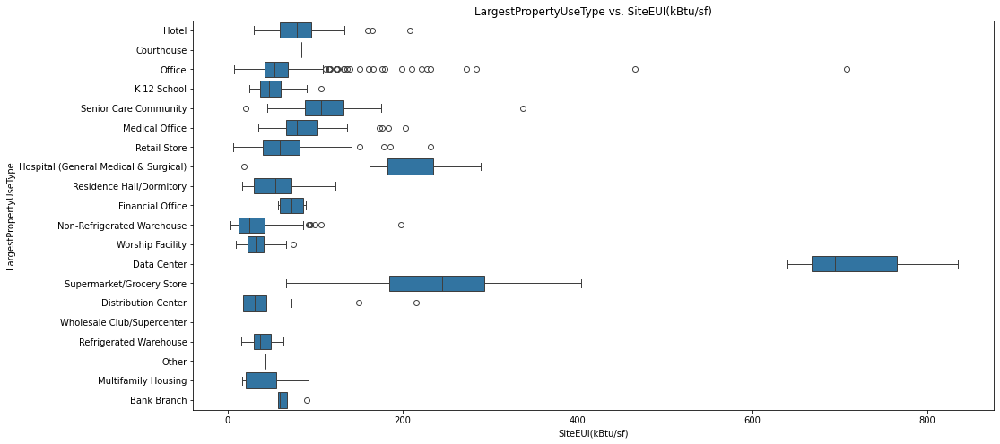

In [49]:
plt.figure(figsize=(16, 8))
sns.boxplot(y='LargestPropertyUseType', x='SiteEUI(kBtu/sf)', data=building_data)
# plt.xticks(rotation=90)
plt.title("LargestPropertyUseType vs. SiteEUI(kBtu/sf)")
plt.show()

In [50]:
building_data['LargestPropertyUseType'].value_counts()

LargestPropertyUseType
Office                                   408
Non-Refrigerated Warehouse               143
Retail Store                              75
Hotel                                     72
Worship Facility                          63
K-12 School                               49
Distribution Center                       41
Supermarket/Grocery Store                 39
Medical Office                            37
Residence Hall/Dormitory                  19
Senior Care Community                     18
Hospital (General Medical & Surgical)     10
Refrigerated Warehouse                     5
Bank Branch                                4
Financial Office                           4
Multifamily Housing                        4
Data Center                                3
Courthouse                                 1
Wholesale Club/Supercenter                 1
Other                                      1
Name: count, dtype: int64

In [51]:
# Grouping various warehouse types under 'Warehouse'
building_data['LargestPropertyUseType'] = building_data['LargestPropertyUseType'].replace('Non-Refrigerated Warehouse', 'Warehouse')
building_data['LargestPropertyUseType'] = building_data['LargestPropertyUseType'].replace('Distribution Center', 'Warehouse')
building_data['LargestPropertyUseType'] = building_data['LargestPropertyUseType'].replace('Refrigerated Warehouse', 'Warehouse')

# Grouping financial institutions and related services under 'Financial Services'
building_data['LargestPropertyUseType'] = building_data['LargestPropertyUseType'].replace('Bank Branch', 'Financial Services')
building_data['LargestPropertyUseType'] = building_data['LargestPropertyUseType'].replace('Financial Office', 'Financial Services')

# Grouping retail establishments under 'Retail'
building_data['LargestPropertyUseType'] = building_data['LargestPropertyUseType'].replace('Retail Store', 'Retail')
building_data['LargestPropertyUseType'] = building_data['LargestPropertyUseType'].replace('Wholesale Club/Supercenter', 'Retail')

#replace other with Retail
building_data['LargestPropertyUseType'] = building_data['LargestPropertyUseType'].replace('Other', 'Retail')

In [52]:
building_data['LargestPropertyUseType'].value_counts()

LargestPropertyUseType
Office                                   408
Warehouse                                189
Retail                                    77
Hotel                                     72
Worship Facility                          63
K-12 School                               49
Supermarket/Grocery Store                 39
Medical Office                            37
Residence Hall/Dormitory                  19
Senior Care Community                     18
Hospital (General Medical & Surgical)     10
Financial Services                         8
Multifamily Housing                        4
Data Center                                3
Courthouse                                 1
Name: count, dtype: int64

In [53]:
# drop columns
building_data = building_data[building_data['LargestPropertyUseType'] != 'Multifamily Housing']
drop_columns = ['ListOfAllPropertyUseTypes','LargestPropertyUseTypeGFA','SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA', 
                'ThirdLargestPropertyUseType','ThirdLargestPropertyUseTypeGFA', 'PrimaryPropertyType']
building_data.drop(drop_columns, axis=1, inplace=True)

### **2.7 Map vs Taregets (SiteEUI(kBtu/sf), GHGEmissionsIntensity )**

In [54]:
import plotly.express as px
import plotly.io as pyo

def plot_map(column):
    fig = px.scatter_mapbox(building_data,
                            lat='Latitude',
                            lon='Longitude',
                            color=column,
                            hover_name='PropertyName')
    
    fig.update_layout(mapbox_style='open-street-map')
    
    title = 'map-' + column
    pyo.show(fig, title=title)
plot_map('SiteEnergyUse(kBtu)')
plot_map('TotalGHGEmissions')

/var/folders/dw/ykrtclk13yx5ypn_4csmx6lm0000gn/T/ipykernel_98642/2383513656.py:5: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(building_data,


/var/folders/dw/ykrtclk13yx5ypn_4csmx6lm0000gn/T/ipykernel_98642/2383513656.py:5: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



***Drop(Latitude, Longitude)***

In [58]:
building_data.drop(['Latitude', 'Longitude','Address'], axis=1, inplace=True)

# Energy Consumption Increases with Building Size"

/var/folders/dw/ykrtclk13yx5ypn_4csmx6lm0000gn/T/ipykernel_98642/1866121596.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



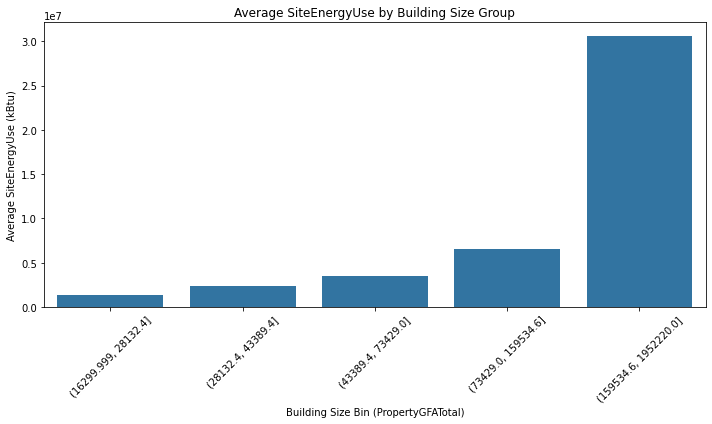

In [59]:
# Create size bins based on quantiles
building_data['SizeBin'] = pd.qcut(building_data['PropertyGFATotal'], q=5, duplicates='drop')

# Calculate average energy use for each bin
avg_energy_by_size = building_data.groupby('SizeBin')['SiteEnergyUse(kBtu)'].mean().reset_index()

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x='SizeBin', y='SiteEnergyUse(kBtu)', data=avg_energy_by_size)
plt.title('Average SiteEnergyUse by Building Size Group')
plt.xlabel('Building Size Bin (PropertyGFATotal)')
plt.ylabel('Average SiteEnergyUse (kBtu)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



/var/folders/dw/ykrtclk13yx5ypn_4csmx6lm0000gn/T/ipykernel_98642/4049291997.py:11: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/dw/ykrtclk13yx5ypn_4csmx6lm0000gn/T/ipykernel_98642/4049291997.py:15: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/var/folders/dw/ykrtclk13yx5ypn_4csmx6lm0000gn/T/ipykernel_98642/4049291997.py:20: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.

/Users/elkihale.n-abualqumboz.mk/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.



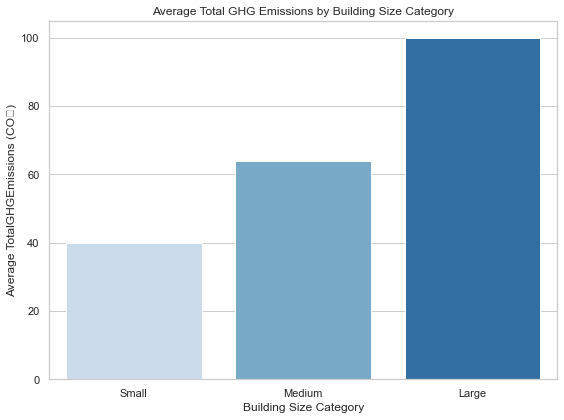

In [104]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Create bins for building size
bins = [0, 50000, 150000, 2000000]
labels = ['Small', 'Medium', 'Large']
building_data['SizeCategory'] = pd.cut(building_data['PropertyGFATotal'], bins=bins, labels=labels)

# Group and calculate mean GHG emissions
grouped = building_data.groupby('SizeCategory')['TotalGHGEmissions'].mean().reset_index()

# Plot
plt.figure(figsize=(8, 6))
sns.barplot(data=grouped, x='SizeCategory', y='TotalGHGEmissions', palette='Blues')

plt.title("Average Total GHG Emissions by Building Size Category")
plt.xlabel("Building Size Category")
plt.ylabel("Average TotalGHGEmissions (CO₂)")
plt.tight_layout()
plt.show()


### ***2.8 Analysis of Energy Consumption & TotalGHGEmissions by Property Type***

In [60]:
# Select only numeric columns for grouping
numeric_columns = building_data.select_dtypes(include=[np.number])

# Group by 'LargestPropertyUseType' and compute the mean
grouped = building_data.groupby("LargestPropertyUseType")[numeric_columns.columns].mean()

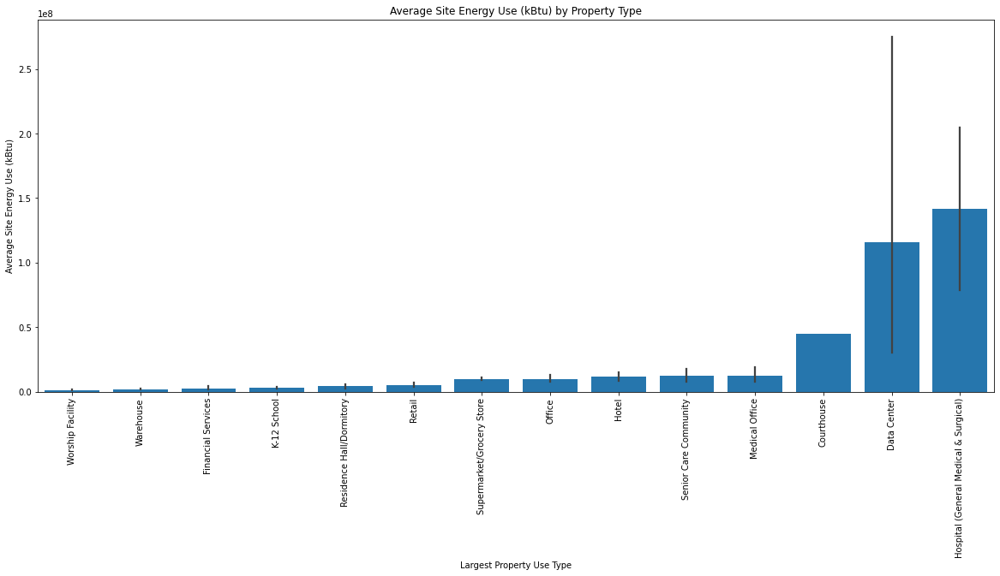

In [61]:
# Get the order for sorting the bars in ascending order
order = grouped["SiteEnergyUse(kBtu)"].sort_values().index

# Plot bar chart
plt.figure(figsize=(20, 8))
ax = sns.barplot(
    x="LargestPropertyUseType",
    y="SiteEnergyUse(kBtu)",
    data=building_data,
    order=order,
    saturation=0.9,
)

plt.xticks(rotation=90)
plt.title("Average Site Energy Use (kBtu) by Property Type")
plt.xlabel("Largest Property Use Type")
plt.ylabel("Average Site Energy Use (kBtu)")
plt.show()

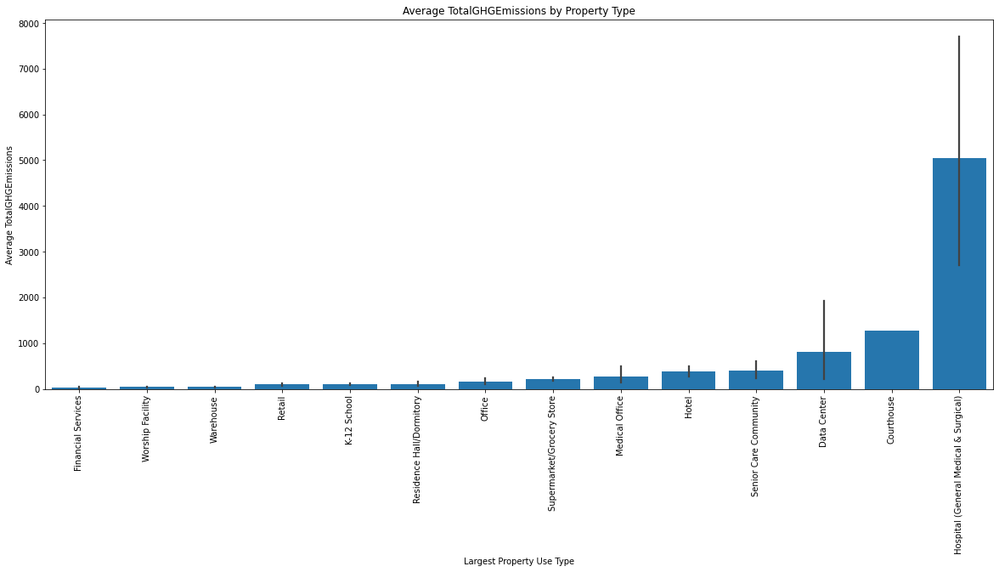

In [62]:
# Get the order for sorting the bars in ascending order
order = grouped["TotalGHGEmissions"].sort_values().index

# Plot bar chart
plt.figure(figsize=(20, 8))
ax = sns.barplot(
    x="LargestPropertyUseType",
    y="TotalGHGEmissions",
    data=building_data,
    order=order,
    saturation=0.9,
)

plt.xticks(rotation=90)
plt.title("Average TotalGHGEmissions by Property Type")
plt.xlabel("Largest Property Use Type")
plt.ylabel("Average TotalGHGEmissions")
plt.show()

### 2.9 Buildings features (NumberofBuildings , NumberofFloors )
***NumberofBuildings***

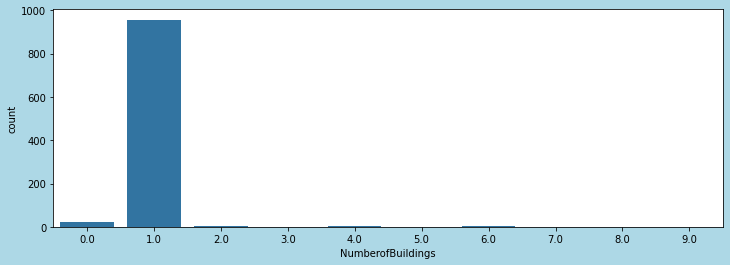

In [63]:
plt.figure(figsize=(12,4), facecolor="lightblue")
sns.countplot(data=building_data, x='NumberofBuildings')
plt.show()

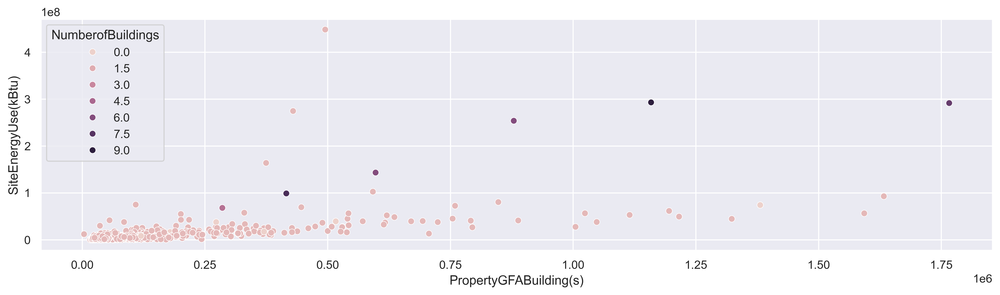

In [64]:
plt.figure(figsize=(16, 4), dpi=400)
sns.set(font_scale=1)
sns.scatterplot(data=building_data, x='PropertyGFABuilding(s)', y='SiteEnergyUse(kBtu)', hue='NumberofBuildings');

In [65]:
building_data['NumberofBuildings'].value_counts()

NumberofBuildings
1.0    957
0.0     24
2.0      3
4.0      2
6.0      2
9.0      1
7.0      1
5.0      1
3.0      1
8.0      1
Name: count, dtype: int64

- Most of the properties have one building : 957 , there is 24 property has 0 building , will be replaced by 1 

In [66]:
building_data['NumberofBuildings'].isnull().sum()*100

np.int64(0)

In [67]:
building_data['NumberofBuildings'].fillna(value=1, inplace=True)
building_data['NumberofBuildings'].replace(0,1, inplace=True)

/var/folders/dw/ykrtclk13yx5ypn_4csmx6lm0000gn/T/ipykernel_98642/873816029.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/var/folders/dw/ykrtclk13yx5ypn_4csmx6lm0000gn/T/ipykernel_98642/873816029.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df

***NumberofFloors***

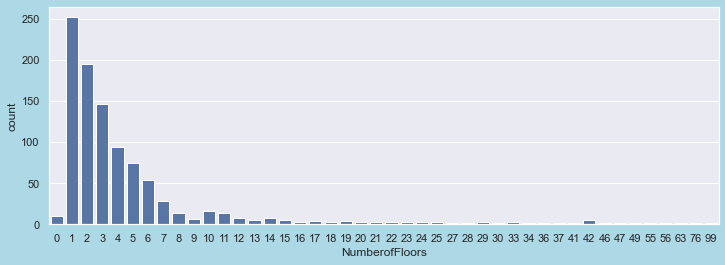

In [68]:
plt.figure(figsize=(12,4), facecolor="lightblue")
sns.countplot(data=building_data, x='NumberofFloors')
plt.show()

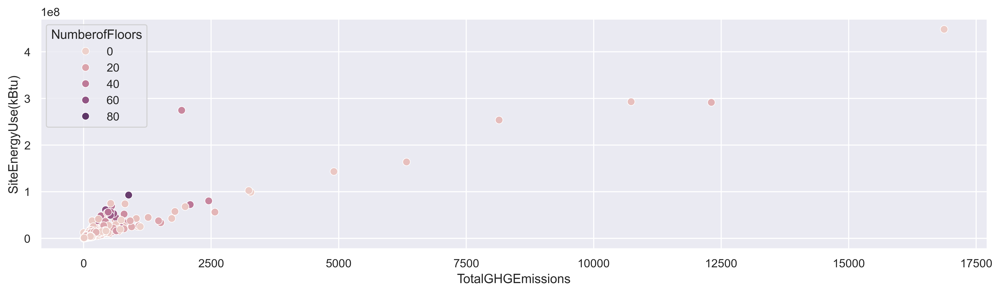

In [69]:
plt.figure(figsize=(16, 4), dpi=400)
sns.set(font_scale=1)

ax = sns.scatterplot(
    y='SiteEnergyUse(kBtu)',          # Y-axis column
    x='TotalGHGEmissions',            # X-axis column
    data=building_data,               # Correct parameter name: data= (not building_data=)
    s=50,                             # Marker size
    hue='NumberofFloors'                # Color encoding
)

plt.show()

<Axes: xlabel='NumberofFloors', ylabel='SiteEnergyUse(kBtu)'>

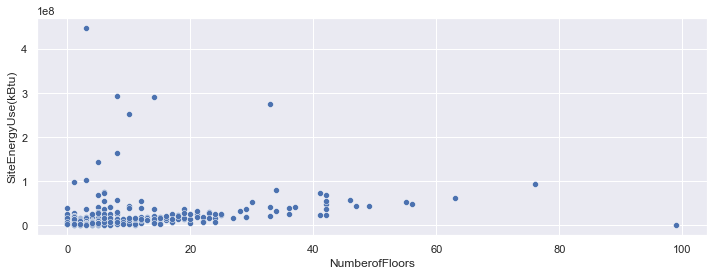

In [70]:
fig, ax = plt.subplots(1,figsize=(12,4))

sns.scatterplot(data=building_data, x='NumberofFloors', y= 'SiteEnergyUse(kBtu)')

In [71]:
building_data['NumberofFloors'].value_counts()

NumberofFloors
1     252
2     195
3     147
4      94
5      75
6      54
7      28
10     16
8      14
11     14
0      10
12      8
14      8
9       7
42      5
13      5
15      5
17      4
19      4
25      3
23      3
21      3
18      3
33      3
22      3
20      3
16      3
24      3
29      3
41      2
36      2
34      2
28      1
47      1
37      1
49      1
55      1
63      1
30      1
46      1
56      1
76      1
27      1
99      1
Name: count, dtype: int64

Found : There is 10 building with 0 floors and many without building even though it is  having an energy consumption.

Replace 0 by 1 

In [72]:
building_data['NumberofFloors'] = building_data['NumberofFloors'].replace(0,1)

<h1 style="color: Green;"> 3. Feature engineering , corr & Targets </h1> 

 
### **Target**
1. **Primary Target for Energy Consumption Prediction:**  
   **SiteEUI(kBtu/sf)** → Measures energy efficiency, independent of building size.  
   **SiteEnergyUse(kBtu)** is total consumption and strongly correlated with building size.  

2. **Primary Target for CO₂ Emissions Prediction:**  
    **GHGEmissionsIntensity (kg CO₂/sf)** → Normalized emissions per square foot, making comparisons fair.  
    **TotalGHGEmissions** is total emissions and highly dependent on building size.  

---

### 3.1 Stats (numercical)

In [73]:
building_data.describe()

,OSEBuildingID,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
count,993.000000,993.000000,993.000000,993.000000,9.930000e+02,993.000000,9.930000e+02,993.000000,993.000000,993.000000,9.930000e+02,9.930000e+02,9.930000e+02,9.930000e+02,993.000000,993.000000
mean,14753.313192,1963.072508,1.046324,5.118832,1.291452e+05,16493.472306,1.126517e+05,63.600201,68.494864,172.252266,8.882392e+06,6.011857e+05,6.268962e+06,1.980236e+06,195.277976,1.409678
std,13398.025600,31.982997,0.489681,8.099929,2.104744e+05,47668.776807,1.831180e+05,28.827670,69.957261,188.993227,2.586579e+07,6.446515e+06,1.573975e+07,1.132767e+07,863.380623,2.028441
min,1.000000,1900.000000,1.000000,1.000000,1.630000e+04,0.000000,3.636000e+03,1.000000,2.100000,0.000000,7.971180e+04,0.000000e+00,-1.154170e+05,0.000000e+00,-0.800000,-0.020000
25%,553.000000,1937.000000,1.000000,1.000000,3.152100e+04,0.000000,3.017200e+04,44.000000,34.599998,81.000000,1.269848e+06,0.000000e+00,7.865470e+05,0.000000e+00,20.300000,0.330000
50%,20500.000000,1968.000000,1.000000,3.000000,5.362000e+04,0.000000,5.073400e+04,71.000000,51.900002,136.899994,2.826828e+06,0.000000e+00,1.884294e+06,3.991220e+05,49.740000,0.750000
75%,24219.000000,1988.000000,1.000000,5.000000,1.268230e+05,0.000000,1.079300e+05,88.000000,74.800003,197.600006,7.739699e+06,0.000000e+00,5.652230e+06,1.387450e+06,144.410000,1.700000
max,50081.000000,2015.000000,9.000000,99.000000,1.952220e+06,512608.000000,1.765970e+06,100.000000,834.400024,2620.000000,4.483853e+08,1.349435e+08,2.745325e+08,2.979090e+08,16870.980000,34.090000


### 3.2 Stats categoricals 

In [74]:
building_data.describe(include = 'O')

,BuildingType,PropertyName,Neighborhood,LargestPropertyUseType
count,993,993,993,993
unique,4,992,13,14
top,NonResidential,Bayview Building,Downtown,Office
freq,972,2,243,408


### 3.3 Negative values

In [75]:
negatives = (building_data['SiteEnergyUse(kBtu)'] < 0) | (building_data['GHGEmissionsIntensity'] < 0) | (building_data['Electricity(kBtu)'] < 0) | (building_data['TotalGHGEmissions'] < 0) | (building_data['SourceEUI(kBtu/sf)'] < 0) | (building_data['PropertyGFAParking'] < 0) | (building_data['PropertyGFABuilding(s)'] < 0)

In [76]:
negatives.value_counts()

False    992
True       1
Name: count, dtype: int64

In [77]:
building_data = building_data[~negatives] 

### 3.4 Visualizes the relationship between energy consumption and GHG emissions

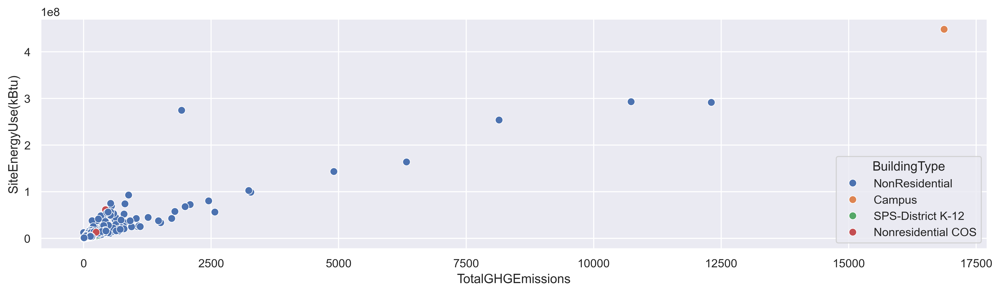

In [78]:
plt.figure(figsize=(16, 4), dpi=400)
sns.set(font_scale=1)

ax = sns.scatterplot(
    y='SiteEnergyUse(kBtu)',          # Y-axis column
    x='TotalGHGEmissions',            # X-axis column
    data=building_data,               # Correct parameter name: data= (not building_data=)
    s=50,                             # Marker size
    hue='BuildingType'                # Color encoding
)

plt.show()


1. **Positive Correlation:**
   - There is a general **upward trend**, meaning **buildings that consume more energy also tend to produce higher GHG emissions**.
   - This is expected because **energy use (kBtu) is a major factor in emissions**.

2. **Presence of Outliers:**
   - A **few buildings (green dots - Campus buildings)** are extreme outliers with **very high SiteEnergyUse(kBtu)** (> 6 × 10⁸) but relatively **low TotalGHGEmissions**.
   - These are **large university campuses or industrial buildings** that consume a lot of energy but may use **renewable sources**, reducing their emissions.

3. **Cluster of Small-Scale Buildings:**
   - The majority of buildings are clustered in the **bottom-left**, indicating **lower energy consumption and emissions**.
   - This suggests that most buildings in the dataset are **relatively small** or have **energy-efficient practices**.

In [79]:
building_data[building_data['SiteEnergyUse(kBtu)'] > 4*10**8]

,OSEBuildingID,BuildingType,PropertyName,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,SizeBin
35,43,Campus,Plant 2 Site,Greater Duwamish,1992,1.0,3,494835,0,494835,Office,8.0,221.699997,388.200012,448385312.0,0.0,150476283.0,297909000.0,16870.98,34.09,"(159534.6, 1952220.0]"


In [80]:
building_data[building_data['TotalGHGEmissions'] > 15*10**3]

,OSEBuildingID,BuildingType,PropertyName,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,SizeBin
35,43,Campus,Plant 2 Site,Greater Duwamish,1992,1.0,3,494835,0,494835,Office,8.0,221.699997,388.200012,448385312.0,0.0,150476283.0,297909000.0,16870.98,34.09,"(159534.6, 1952220.0]"


### 3.5 Analyzing Target Data Distribution

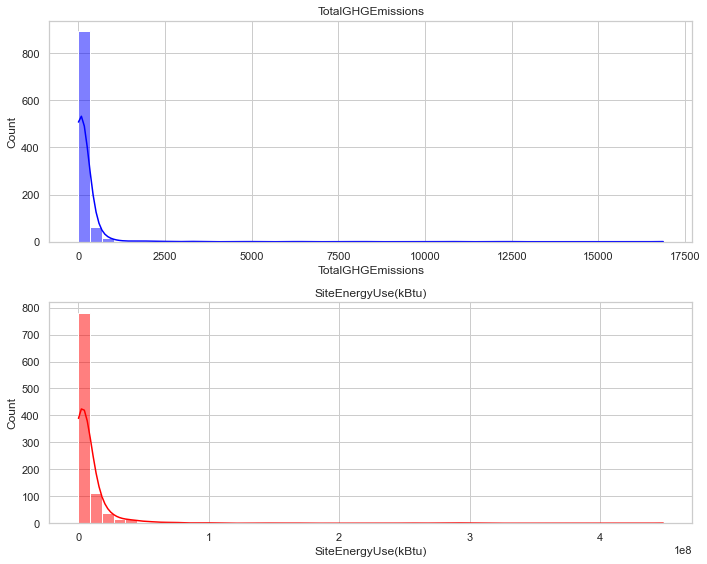

In [81]:
# Set plot style
sns.set_style("whitegrid")

# Create figure with 2 vertical subplots (2 rows, 1 column)
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))  # Adjusted for vertical layout

# First histogram - TotalGHGEmissions 
sns.histplot(building_data['TotalGHGEmissions'], bins=50, kde=True, color='blue', ax=axes[0])
axes[0].set_title("TotalGHGEmissions")

# Second histogram - SiteEnergyUse(kBtu) 
sns.histplot(building_data['SiteEnergyUse(kBtu)'], bins=50, kde=True, color='red', ax=axes[1])
axes[1].set_title("SiteEnergyUse(kBtu)")

# Adjust layout
plt.tight_layout()
plt.show()

#### **Insights from Histograms:**
- **Both distributions are highly skewed** (right-skewed).
- There are **outliers** with extreme values 
- The majority of values are **clustered near zero**, meaning most buildings have relatively low energy use and emissions.

---

### Stats

In [82]:
summary_stats_iqr = building_data[['TotalGHGEmissions', 'SiteEnergyUse(kBtu)']].describe().T
summary_stats_iqr['skew'] = building_data[['TotalGHGEmissions', 'SiteEnergyUse(kBtu)']].skew()
summary_stats_iqr['kurtosis'] = building_data[['TotalGHGEmissions', 'SiteEnergyUse(kBtu)']].kurtosis()
summary_stats_iqr

,count,mean,std,min,25%,50%,75%,max,skew,kurtosis
TotalGHGEmissions,992.0,1.954756e+02,8.637936e+02,0.00000,20.42,49.86,144.505,1.687098e+04,13.397991,211.028723
SiteEnergyUse(kBtu),992.0,8.891000e+06,2.587741e+07,79711.79688,1272999.25,2827889.25,7746788.625,4.483853e+08,10.235790,133.027359


---

### **Insights from Summary Statistics**
1. **Right-Skewed Distributions (High Skewness)**
   - **TotalGHGEmissions (13.40 skew)**
   - **SiteEnergyUse(kBtu) (10.24 skew)**
   - Both distributions are **highly right-skewed**, meaning **a few buildings** have extremely high energy usage and emissions.

2. **High Kurtosis (Heavy Tails)**
   - **TotalGHGEmissions kurtosis = 211.03**
   - **SiteEnergyUse(kBtu) kurtosis = 133.03**
   - These **very high values** indicate that the dataset has a large number of extreme outliers.

3. **Large Range of Values**
   - **Energy usage ranges from 79,711 kBtu to 448.38M kBtu** (factor of ~5,600).
   - **Emissions range from 0 to 16,870** (some buildings have very low emissions, others are massive emitters).
   - This supports the idea that **normalization** (energy/emissions per square meter) is needed.

---

In [83]:
# building_data[building_data['TotalGHGEmissions'] <= 0]

### remove this outlier 

In [84]:
# building_data = building_data[building_data['TotalGHGEmissions'] > 0].copy()

In [85]:
building_data[building_data['SiteEnergyUse(kBtu)'] <= 0]

,OSEBuildingID,BuildingType,PropertyName,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,ENERGYSTARScore,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,SizeBin


In [86]:
# Step 1: Apply Fixed Threshold Outlier Removal
building_data = building_data[building_data['SiteEnergyUse(kBtu)'] < 4*10**8]
building_data = building_data[building_data['TotalGHGEmissions'] < 15*10**3]

# Step 2: Replace Negative Emissions with 0 (to avoid log issues)
building_data['TotalGHGEmissions'] = building_data['TotalGHGEmissions'].clip(lower=0)

In [87]:
### Method : IQR-Based Outlier Removal
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
# # Copy the dataframe
building_data = building_data.copy()
building_data = remove_outliers_iqr(building_data, 'SiteEnergyUse(kBtu)')
building_data = remove_outliers_iqr(building_data, 'TotalGHGEmissions')

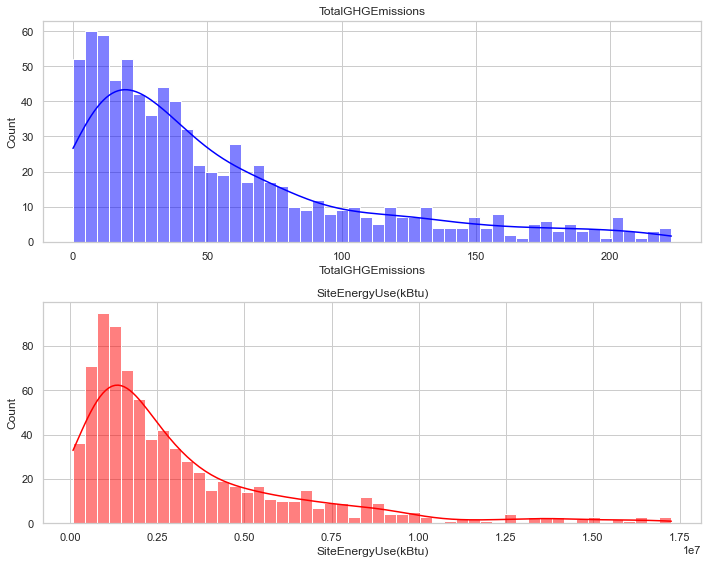

In [88]:
# Set plot style
sns.set_style("whitegrid")

# Create figure with 2 vertical subplots (2 rows, 1 column)
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))  # Adjusted for vertical layout

# First histogram - TotalGHGEmissions 
sns.histplot(building_data['TotalGHGEmissions'], bins=50, kde=True, color='blue', ax=axes[0])
axes[0].set_title("TotalGHGEmissions")

# Second histogram - SiteEnergyUse(kBtu) 
sns.histplot(building_data['SiteEnergyUse(kBtu)'], bins=50, kde=True, color='red', ax=axes[1])
axes[1].set_title("SiteEnergyUse(kBtu)")

# Adjust layout
plt.tight_layout()
plt.show()

# Log tranformation

In [89]:
building_data1 = building_data.copy()

In [90]:

# Replace negative values with NaN before log transformation
# building_data1['GHGEmissionsIntensity'] = building_data1['GHGEmissionsIntensity'].clip(lower=0)

# Apply log transformation safely
building_data1['Log_TotalGHGEmissions'] = np.log1p(building_data1['TotalGHGEmissions'])
building_data1['Log_SiteEnergyUse(kBtu)'] = np.log1p(building_data1['SiteEnergyUse(kBtu)'])

# Recalculate summary statistics
summary_stats_iqr = building_data1[['TotalGHGEmissions', 'SiteEnergyUse(kBtu)']].describe().T
summary_stats_iqr['skew'] = building_data1[['TotalGHGEmissions', 'SiteEnergyUse(kBtu)']].skew()
summary_stats_iqr['kurtosis'] = building_data1[['TotalGHGEmissions', 'SiteEnergyUse(kBtu)']].kurtosis()
summary_stats_iqr

,count,mean,std,min,25%,50%,75%,max,skew,kurtosis
TotalGHGEmissions,807.0,5.456203e+01,5.140360e+01,0.00000,1.610000e+01,37.08,75.02,222.78,1.352822,1.166851
SiteEnergyUse(kBtu),807.0,3.276772e+06,3.231385e+06,79711.79688,1.116127e+06,2067352.50,4363835.50,17254810.00,1.913609,3.876856


In [91]:
# # Set plot style
# sns.set_style("whitegrid")

# # Create figure with 2 vertical subplots (2 rows, 1 column)
# fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))  # Adjusted for vertical layout

# # First histogram - TotalGHGEmissions 
# sns.histplot(building_data1['Log_TotalGHGEmissions'], bins=50, kde=True, color='blue', ax=axes[0])
# axes[0].set_title("Log_TotalGHGEmissions")

# # Second histogram - SiteEnergyUse(kBtu) 
# sns.histplot(building_data1['Log_SiteEnergyUse(kBtu)'], bins=50, kde=True, color='red', ax=axes[1])
# axes[1].set_title("Log_SiteEnergyUse(kBtu)")

# # Adjust layout
# plt.tight_layout()
# plt.show()

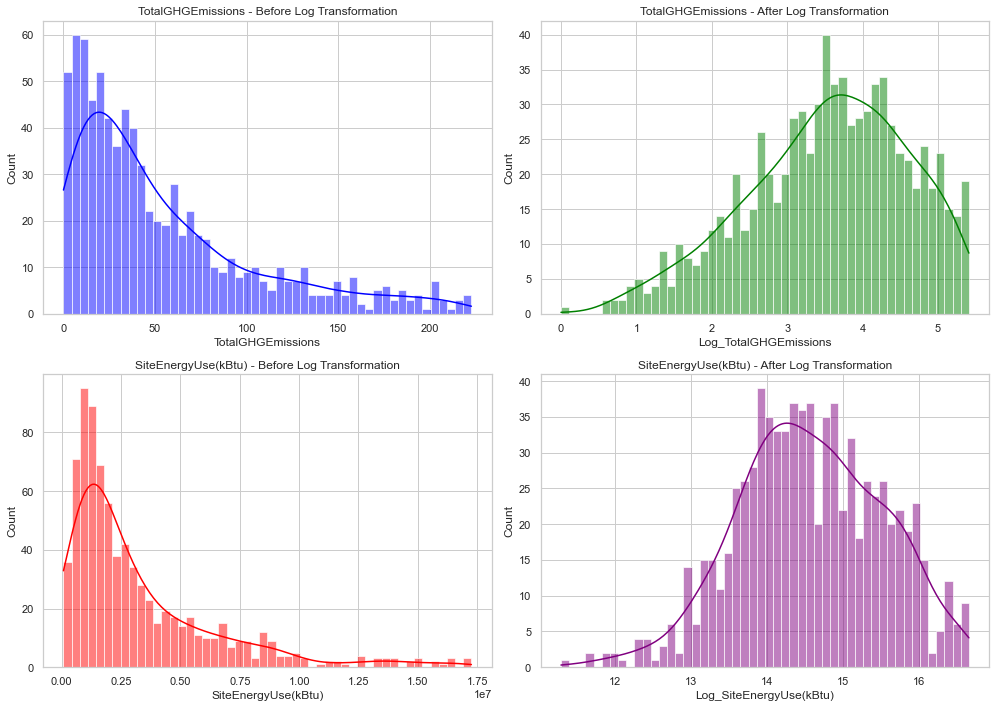

In [92]:
# Set plot style
sns.set_style("whitegrid")

# Create figure with subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))

# 1️ Histogram - TotalGHGEmissions (Before Log Transformation)
sns.histplot(building_data1['TotalGHGEmissions'], bins=50, kde=True, color='blue', ax=axes[0, 0])
axes[0, 0].set_title("TotalGHGEmissions - Before Log Transformation")

# 2️ Histogram - Log_TotalGHGEmissions (After Log Transformation)
sns.histplot(building_data1['Log_TotalGHGEmissions'], bins=50, kde=True, color='green', ax=axes[0, 1])
axes[0, 1].set_title("TotalGHGEmissions - After Log Transformation")

# 3️ Histogram - SiteEnergyUse(kBtu) (Before Log Transformation)
sns.histplot(building_data1['SiteEnergyUse(kBtu)'], bins=50, kde=True, color='red', ax=axes[1, 0])
axes[1, 0].set_title("SiteEnergyUse(kBtu) - Before Log Transformation")

# 4️ Histogram - Log_SiteEnergyUse (After Log Transformation)
sns.histplot(building_data1['Log_SiteEnergyUse(kBtu)'], bins=50, kde=True, color='purple', ax=axes[1, 1])
axes[1, 1].set_title("SiteEnergyUse(kBtu) - After Log Transformation")

# Adjust layout
plt.tight_layout()
plt.show()

# 4- Feature engineering

### 4.1 Energy Ratios (Electricity, Steam, Natural Gas)**

Using energy **ratios** instead of absolute values provides **relative insights** that help in better comparison across buildings of different sizes and energy consumption levels.

**- Normalization Across Different Building Sizes**
- Absolute values of **electricity, steam, and natural gas consumption** can be misleading because **larger buildings naturally consume more energy**.
- By using **ratios**, we **normalize** the energy consumption relative to total energy use, making comparisons fair.

**Example:**
- **Building A** (Large Mall):  
  - Electricity = **5,000,000 kBtu**  
  - Total Energy = **10,000,000 kBtu**  
  - Electricity Ratio = **50%**
  
- **Building B** (Small Office):  
  - Electricity = **500,000 kBtu**  
  - Total Energy = **1,000,000 kBtu**  
  - Electricity Ratio = **50%**

**Even though their absolute electricity usage is different, their ratio is the same, meaning they rely equally on electricity.**

---

**-Avoids Data Leakage**
- If **total energy usage** (our target variable) is in our feature set, using absolute values of energy consumption can introduce **data leakage**.
- **Energy ratios** only describe the **composition** of energy sources, making them valid predictors.

---

**- Helps Identify Energy Source Dependencies**
- Buildings that rely **heavily on natural gas** may have different energy efficiency profiles than those that **primarily use electricity**.
- **Ratios highlight these patterns**, which can improve model predictions.

**Example:**
- A building with **90% natural gas usage** may have different seasonal consumption trends than one that **relies 90% on electricity**.

---

In [93]:
building_data['SteamRatio'] = building_data['SteamUse(kBtu)'] / building_data['SiteEnergyUse(kBtu)']
building_data['ElectricityRatio'] = building_data['Electricity(kBtu)'] / building_data['SiteEnergyUse(kBtu)']
building_data['NaturalGasRatio'] = building_data['NaturalGas(kBtu)'] / building_data['SiteEnergyUse(kBtu)']

In [94]:
building_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 807 entries, 6 to 3347
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   OSEBuildingID           807 non-null    int64   
 1   BuildingType            807 non-null    object  
 2   PropertyName            807 non-null    object  
 3   Neighborhood            807 non-null    object  
 4   YearBuilt               807 non-null    int64   
 5   NumberofBuildings       807 non-null    float64 
 6   NumberofFloors          807 non-null    int64   
 7   PropertyGFATotal        807 non-null    int64   
 8   PropertyGFAParking      807 non-null    int64   
 9   PropertyGFABuilding(s)  807 non-null    int64   
 10  LargestPropertyUseType  807 non-null    object  
 11  ENERGYSTARScore         807 non-null    float64 
 12  SiteEUI(kBtu/sf)        807 non-null    float64 
 13  SourceEUI(kBtu/sf)      807 non-null    float64 
 14  SiteEnergyUse(kBtu)     807 no

### **3.6 Area Ratio**

 ***create the surface per floor and per building columns***

In [95]:
building_data['SurfacePerBuilding'] = building_data['PropertyGFABuilding(s)'] / building_data['NumberofBuildings']
building_data['SurfacePerFloor'] = building_data['PropertyGFABuilding(s)'] / building_data['NumberofFloors']

In [96]:
building_data['ParkingRatio'] = building_data['PropertyGFAParking'] / building_data['PropertyGFATotal']
building_data['BuildingRatio'] = building_data['PropertyGFABuilding(s)'] / building_data['PropertyGFATotal']

 
---

1. **`SurfacePerBuilding`:**
   - **Definition:** Average surface area per building.
   - **Usefulness:** Great for capturing how large each individual building is, especially useful when you have multiple buildings on the same property.

2. **`SurfacePerFloor`:**
   - **Definition:** Surface area per floor.
   - **Usefulness:** Valuable for determining how large or dense floors are. High-density floors might correlate strongly with energy use.

3. **`ParkingRatio`:**
   - **Definition:** Proportion of total property area dedicated to parking.
   - **Usefulness:** Critical to understanding if the presence of extensive parking affects energy efficiency. Parking often consumes less energy than occupied building space, so this ratio helps quantify that.

4. **`BuildingRatio`:**
   - **Definition:** Proportion of total property area occupied by buildings (excluding parking).
   - **Usefulness:** Offers complementary insight to `ParkingRatio`—a higher building ratio generally implies more intense usage and potentially higher energy consumption and emissions.

---

   - **Total area metrics** (`PropertyGFATotal`, `PropertyGFABuilding(s)`) are fundamental and provide an absolute sense of size, crucial for understanding baseline energy needs.
   - **Ratios** give additional context, allowing the model to understand the composition and efficiency of the property.

---


### 3.7 Building Age 

In [97]:
building_data['building_age'] = 2025 - building_data['YearBuilt'] 

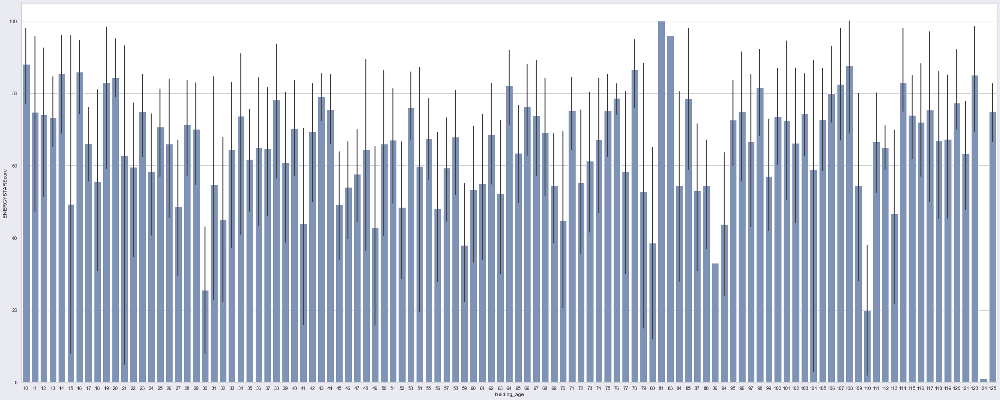

In [98]:
plt.figure(figsize=(40,16), facecolor="#eaeaf2")

sns.barplot(data=building_data, x='building_age', y='ENERGYSTARScore', color='#7490c0');
plt.show()

### 3.8 EnergyStar Score

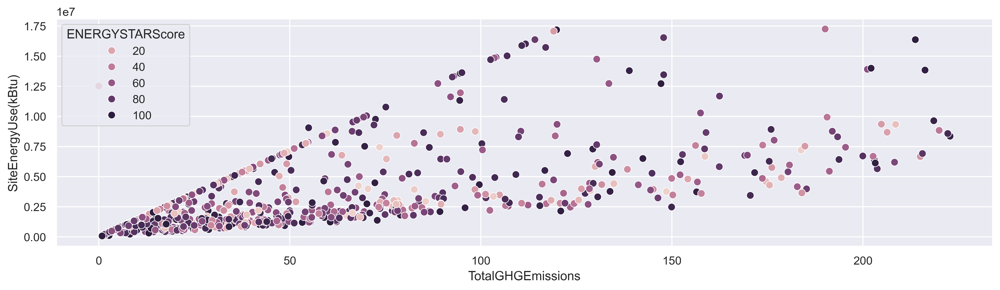

In [99]:
plt.figure(figsize=(16, 4), dpi=400)
sns.set(font_scale=1)

ax = sns.scatterplot(
    y='SiteEnergyUse(kBtu)',          # Y-axis column
    x='TotalGHGEmissions',            # X-axis column
    data=building_data,               # Correct parameter name: data= (not building_data=)
    s=50,                             # Marker size
    hue='ENERGYSTARScore'                # Color encoding
)

plt.show()

In [100]:
building_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 807 entries, 6 to 3347
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   OSEBuildingID           807 non-null    int64   
 1   BuildingType            807 non-null    object  
 2   PropertyName            807 non-null    object  
 3   Neighborhood            807 non-null    object  
 4   YearBuilt               807 non-null    int64   
 5   NumberofBuildings       807 non-null    float64 
 6   NumberofFloors          807 non-null    int64   
 7   PropertyGFATotal        807 non-null    int64   
 8   PropertyGFAParking      807 non-null    int64   
 9   PropertyGFABuilding(s)  807 non-null    int64   
 10  LargestPropertyUseType  807 non-null    object  
 11  ENERGYSTARScore         807 non-null    float64 
 12  SiteEUI(kBtu/sf)        807 non-null    float64 
 13  SourceEUI(kBtu/sf)      807 non-null    float64 
 14  SiteEnergyUse(kBtu)     807 no

## Correlations between the variables


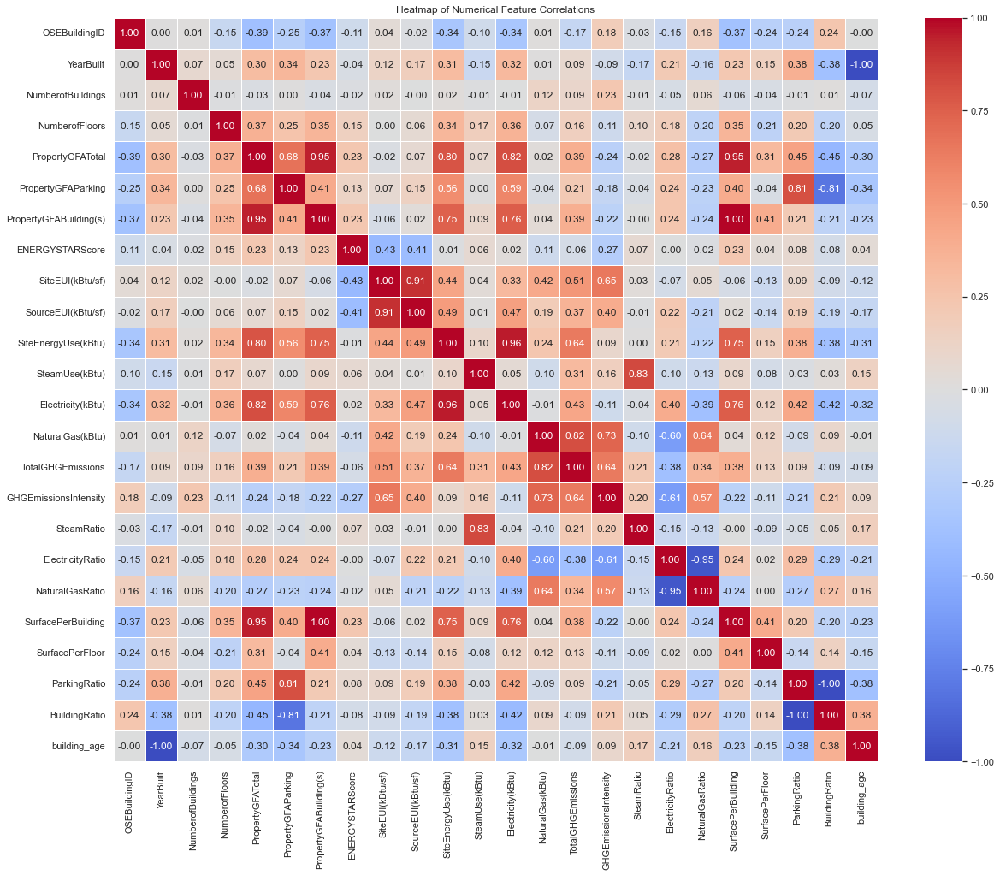

In [101]:
numerical_data = building_data.select_dtypes(include=['number'])
correlation_matrix = numerical_data.corr()

plt.figure(figsize=(20,16))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap of Numerical Feature Correlations')
plt.show()


In [102]:
columns_to_drop =    ['SourceEUI(kBtu/sf)','SteamUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)'
                     ,'SiteEUI(kBtu/sf)', 'GHGEmissionsIntensity', 'YearBuilt', 'SourceEUI(kBtu/sf)']
building_data.drop(columns = columns_to_drop , axis=1, inplace=True)
building_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 807 entries, 6 to 3347
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   OSEBuildingID           807 non-null    int64   
 1   BuildingType            807 non-null    object  
 2   PropertyName            807 non-null    object  
 3   Neighborhood            807 non-null    object  
 4   NumberofBuildings       807 non-null    float64 
 5   NumberofFloors          807 non-null    int64   
 6   PropertyGFATotal        807 non-null    int64   
 7   PropertyGFAParking      807 non-null    int64   
 8   PropertyGFABuilding(s)  807 non-null    int64   
 9   LargestPropertyUseType  807 non-null    object  
 10  ENERGYSTARScore         807 non-null    float64 
 11  SiteEnergyUse(kBtu)     807 non-null    float64 
 12  TotalGHGEmissions       807 non-null    float64 
 13  SizeBin                 807 non-null    category
 14  SteamRatio              807 no

In [95]:
building_data.to_csv('building_data_modelling.csv', index=False)